# EDA + Preprocesamiento.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn.datasets import make_regression
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import r2_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import LeaveOneOut

In [2]:
df1 = pd.read_csv("song_data.csv")
df2= pd.read_csv("song_info.csv")

In [3]:
df1 = df1.drop_duplicates(subset='song_name')
df2 = df2.drop_duplicates(subset='song_name')

In [4]:
df = pd.merge(df1, df2, on='song_name', how='inner')

In [5]:
df.describe(include = "all")

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,artist_name,album_names,playlist
count,13070,13070.000000,1.307000e+04,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070.000000,13070,13070,13070
unique,13070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7208,11097,297
top,Boulevard of Broken Dreams,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lady Gaga,Greatest Hits,60s Rock Anthems
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,50,100
mean,NaN,48.487682,2.186274e+05,0.277770,0.625010,0.635722,0.096672,5.319510,0.180517,-7.790448,0.632976,0.100839,121.151915,3.951568,0.528564,NaN,NaN,NaN
std,NaN,20.108158,6.345056e+04,0.301784,0.159125,0.223985,0.246570,3.583933,0.145377,4.110762,0.482011,0.105197,29.105418,0.319291,0.248652,NaN,NaN,NaN
min,NaN,0.000000,1.200000e+04,0.000001,0.000000,0.001070,0.000000,0.000000,0.011900,-38.768000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,37.000000,1.829672e+05,0.025000,0.524250,0.490000,0.000000,2.000000,0.093300,-9.537250,0.000000,0.037300,98.069500,4.000000,0.334000,NaN,NaN,NaN
50%,NaN,51.000000,2.114860e+05,0.147000,0.637000,0.667000,0.000022,5.000000,0.121000,-6.859500,1.000000,0.054400,120.025000,4.000000,0.529000,NaN,NaN,NaN
75%,NaN,63.000000,2.445060e+05,0.479750,0.741000,0.815000,0.005910,8.000000,0.223000,-5.041250,1.000000,0.115000,139.955750,4.000000,0.730000,NaN,NaN,NaN


In [6]:
df.shape

(13070, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13070 entries, 0 to 13069
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         13070 non-null  object 
 1   song_popularity   13070 non-null  int64  
 2   song_duration_ms  13070 non-null  int64  
 3   acousticness      13070 non-null  float64
 4   danceability      13070 non-null  float64
 5   energy            13070 non-null  float64
 6   instrumentalness  13070 non-null  float64
 7   key               13070 non-null  int64  
 8   liveness          13070 non-null  float64
 9   loudness          13070 non-null  float64
 10  audio_mode        13070 non-null  int64  
 11  speechiness       13070 non-null  float64
 12  tempo             13070 non-null  float64
 13  time_signature    13070 non-null  int64  
 14  audio_valence     13070 non-null  float64
 15  artist_name       13070 non-null  object 
 16  album_names       13070 non-null  object

In [8]:
artist_labelEncoding = LabelEncoder()
artist_labelEncoding.fit(df["artist_name"].values)
artist = artist_labelEncoding.transform(df["artist_name"].values)

In [9]:
df["artist"] = artist
df

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,artist_name,album_names,playlist,artist
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.4740,Green Day,Greatest Hits: God's Favorite Band,00s Rock Anthems,2382
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.3700,Linkin Park,Hybrid Theory,00s Rock Anthems,3640
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.3240,The White Stripes,Elephant,00s Rock Anthems,6404
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.1980,Red Hot Chili Peppers,By The Way (Deluxe Version),00s Rock Anthems,5099
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.5740,Nickelback,Silver Side Up,00s Rock Anthems,4487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13065,Stay Awake,55,114582,0.898000,0.370,0.136,0.000263,7,0.0999,-13.528,1,0.0433,146.081,4,0.0592,Joseph,Stay Awake,Your Favorite Coffeehouse,3093
13066,Let It Breathe,60,159645,0.893000,0.500,0.151,0.000065,11,0.1110,-16.107,1,0.0348,113.969,4,0.3000,Water Liars,Water Liars,Your Favorite Coffeehouse,6797
13067,Sudden Love (Acoustic),23,182211,0.847000,0.719,0.325,0.000000,0,0.1250,-12.222,1,0.0355,130.534,4,0.2860,The Woodlands,"Parallels, Vol. II",Your Favorite Coffeehouse,6408
13068,Gentle on My Mind,55,352280,0.945000,0.488,0.326,0.015700,3,0.1190,-12.020,1,0.0328,106.063,4,0.3230,Robert Ellis,Dear John,Your Favorite Coffeehouse,5194


In [10]:
df.song_duration_ms= df.song_duration_ms.astype(float)
df.time_signature= df.time_signature.astype(float)
df.audio_mode= df.audio_mode.astype(float)

In [11]:
px.imshow(img = df[["song_popularity", "song_duration_ms", "acousticness", "danceability", "energy", "instrumentalness", "key", "liveness", "loudness", "audio_mode", "speechiness", "tempo", "time_signature", "audio_valence", "artist"]].corr()
,color_continuous_scale='Portland')

In [12]:
df_hist = df.drop("song_name", axis=1)

for col in df_hist.columns:
    fig=px.histogram(df_hist, x=col, title=f'Histograma de {col}')

    fig.show()

# Modelos Regression Machine Learning

### Train, Test

In [13]:
X = np.array(df[["song_duration_ms", "acousticness", "danceability", "energy", "instrumentalness", "key", "liveness", "loudness", "audio_mode", "speechiness", "tempo", "time_signature", "audio_valence", "artist"]])
y = np.array(df["song_popularity"])

## 1. Regresión Lineal Múltiple

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)
print(f"Conjunto de Train: {X_train.shape, X_test.shape}")
print(f"Conjunto de Test: {y_train.shape, y_test.shape}")

Conjunto de Train: ((9149, 14), (3921, 14))
Conjunto de Test: ((9149,), (3921,))


In [15]:
#Crear un modelo de regresión múltiple

regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento
regresion_lineal.fit(X_train, y_train)

# Encontramos los coeficientes de la recta  
print ("weights:", regresion_lineal.coef_)
print ("w_0:", regresion_lineal.intercept_)

# Hacer predicciones en el conjunto de prueba
yhat = regresion_lineal.predict(X_test)

for i, j in zip(yhat[:5], y_test[:5]):
    print(f"Predicción:{i} \tValor real:{j}")

weights: [-2.42590484e-06 -3.08698794e+00  5.18036429e+00 -7.57018224e+00
 -6.84995305e+00  4.16397833e-02 -2.23607353e+00  3.45420852e-01
  2.12212150e-01 -7.35669328e-01 -5.77550980e-03  1.94201768e+00
 -5.87576884e+00 -1.63551431e-05]
w_0: 51.26794413688646
Predicción:49.748694758998184 	Valor real:53
Predicción:48.914593640470386 	Valor real:40
Predicción:48.9610531182598 	Valor real:58
Predicción:46.43430054184164 	Valor real:42
Predicción:48.850008669820234 	Valor real:47


In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)
print(f"Conjunto de Train: {X_train.shape, X_test.shape}")
print(f"Conjunto de Test: {y_train.shape, y_test.shape}")

Conjunto de Train: ((9149, 14), (3921, 14))
Conjunto de Test: ((9149,), (3921,))


In [17]:
#Crear un modelo de regresión múltiple

regresion_lineal = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento
regresion_lineal.fit(X_train, y_train)

# Encontramos los coeficientes de la recta  
print ("weights:", regresion_lineal.coef_)
print ("w_0:", regresion_lineal.intercept_)

# Hacer predicciones en el conjunto de prueba
yhat = regresion_lineal.predict(X_test)

for i, j in zip(yhat[:5], y_test[:5]):
    print(f"Predicción:{i} \tValor real:{j}")

weights: [-2.06775520e-06 -3.20057275e+00  6.00726586e+00 -7.42894218e+00
 -6.93794027e+00  6.06985959e-03 -5.81670215e+00  2.71488077e-01
  5.44342243e-01  1.00318420e-01 -2.09849399e-02  1.46855191e+00
 -5.83108237e+00 -4.95044265e-05]
w_0: 54.19001306818359
Predicción:50.61283046423068 	Valor real:64
Predicción:46.69577326240506 	Valor real:31
Predicción:37.88256716995382 	Valor real:46
Predicción:39.845770470114495 	Valor real:38
Predicción:47.27925162756253 	Valor real:44


In [18]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["yhat"] = yhat.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["yhat"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,yhat,diferencia
3211,49,49.000745,0.0015
278,47,46.997715,0.0049
1191,50,50.002964,0.0059
392,55,55.008779,0.0160
2543,45,45.018084,0.0402


### Metricas

In [19]:
RAE = np.sum(np.abs(np.subtract(y_test, yhat))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, yhat))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - regresion_lineal.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [20]:
print(f"MAE:\t {mean_absolute_error(yhat, y_test)}")
print(f"MSE:\t {mean_squared_error(yhat, y_test)}")
print(f"R**2:\t {r2_score(yhat, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 15.872576654492445
MSE:	 399.3188174612768
R**2:	 -43.48031377516973
RAE:	 0.98874828252478
RSE:	 0.980602029881333
Adjusted R**2:	 0.015883267502604825


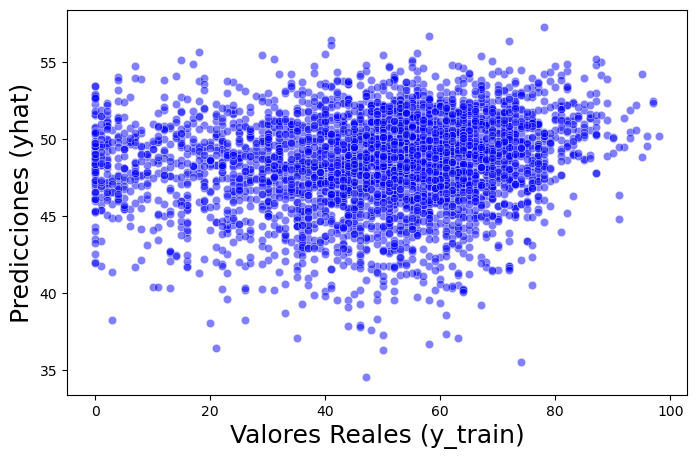

In [21]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = yhat.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 2. Decision Trees Regressor

In [22]:
# Dividir los datos en conjunto de entrenamiento y de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")

# Ajustar el modelo de regresión de árbol de decisión
decision = DecisionTreeRegressor(random_state=42)
decision.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = decision.predict(X_test)

# calcular el error
print("Mean squared error: %.2f" % np.mean((y_pred - y_test) ** 2))

X_train: (9149, 14), y_train: (9149,)
X_test: (3921, 14),  y_test: (3921,)
Mean squared error: 781.42


In [23]:
# Imprimir las predicciones y los valores reales del conjunto de prueba
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

Predicciones: [75. 64. 83. ... 40. 56. 43.]
Valores reales: [ 1 70 69 ... 25 50 76]


In [24]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
2244,46,46.0,0.0
249,60,60.0,0.0
3305,69,69.0,0.0
730,57,57.0,0.0
2416,55,55.0,0.0


### Metricas

In [25]:
r2 = r2_score(y_test, y_pred)
print("R2 score: %.2f" % r2)

R2 score: -0.92


In [26]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - decision.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [27]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 21.844172404998726
MSE:	 781.4203009436368
R**2:	 -0.8013495460058002
RAE:	 1.3566772063872004
RSE:	 1.918375775127752
Adjusted R**2:	 -0.9252516739633352


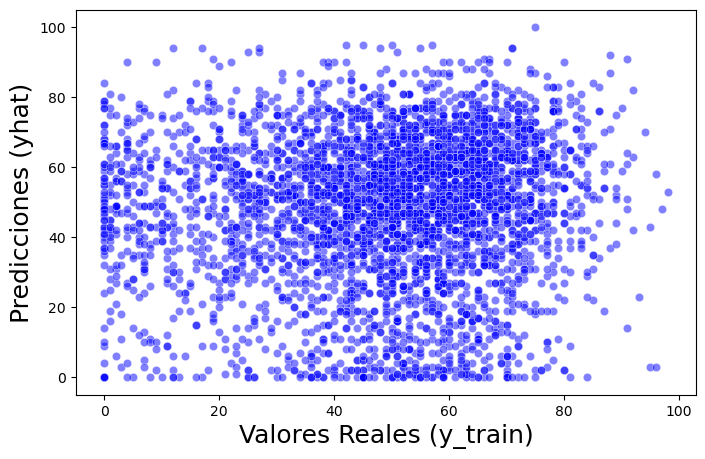

In [28]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 3. Ramdon Forest Regression

In [29]:
#Crear un modelo de regresión random forest
forest = RandomForestRegressor(max_depth = None,
                             random_state = 0,
                             n_estimators = 200,
                             n_jobs = -1)

print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")


# Entrenar el modelo con los datos de entrenamiento
forest.fit(X_train, y_train)

# Hacer predicciones con los datos de prueba
y_pred = forest.predict(X_test)
print(y_pred, y_test)



X_train: (9149, 14), y_train: (9149,)
X_test: (3921, 14),  y_test: (3921,)
[46.495 48.99  57.465 ... 48.01  43.18  49.33 ] [ 1 70 69 ... 25 50 76]


In [30]:
# Imprimir las predicciones y los valores reales del conjunto de prueba
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

Predicciones: [46.495 48.99  57.465 ... 48.01  43.18  49.33 ]
Valores reales: [ 1 70 69 ... 25 50 76]


In [31]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
425,50,49.985,0.0300
764,53,52.975,0.0472
3561,53,52.975,0.0472
1323,49,48.975,0.0510
630,43,42.975,0.0581


### Métricas

In [32]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - forest.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [33]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 15.574742852892241
MSE:	 385.48616677039126
R**2:	 -9.479862311200487
RAE:	 0.9673014034180386
RSE:	 0.9463630815403081
Adjusted R**2:	 0.050244936088579606


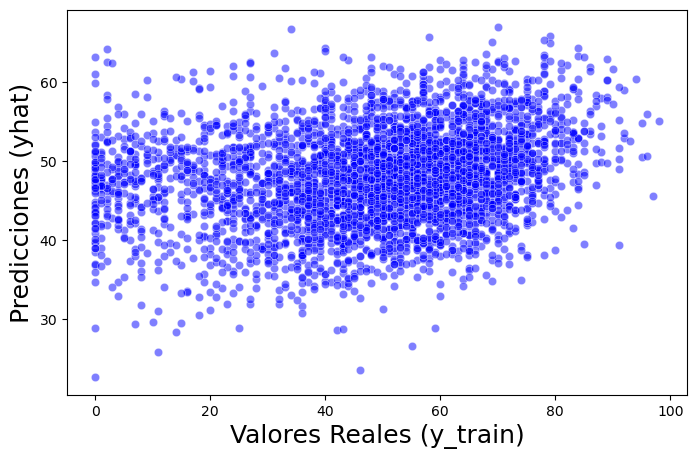

In [34]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 4. k-NN Regresion( k-Nearest Neighbors )

In [35]:
#Crear un modelo de regresión KNN con k=3 vecinos
neigh = KNeighborsRegressor(n_neighbors=3)

# Entrenar el modelo con los datos de entrenamiento
neigh.fit(X_train, y_train)

# Hacer predicciones con los datos de prueba
y_pred = neigh.predict(X_test)

In [36]:
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

X_train: (9149, 14), y_train: (9149,)
X_test: (3921, 14),  y_test: (3921,)
Predicciones: [50.33333333 33.         59.33333333 ... 62.66666667 44.33333333
 56.33333333]
Valores reales: [ 1 70 69 ... 25 50 76]


In [37]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
1464,33,33.0,0.0
2155,52,52.0,0.0
3103,56,56.0,0.0
2927,25,25.0,0.0
1943,52,52.0,0.0


### Metricas

In [38]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - neigh.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [39]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 18.476494091643286
MSE:	 539.5006659298931
R**2:	 -2.931322479778173
RAE:	 1.1475206257914392
RSE:	 1.3244664963725432
Adjusted R**2:	 -0.32921368811581386


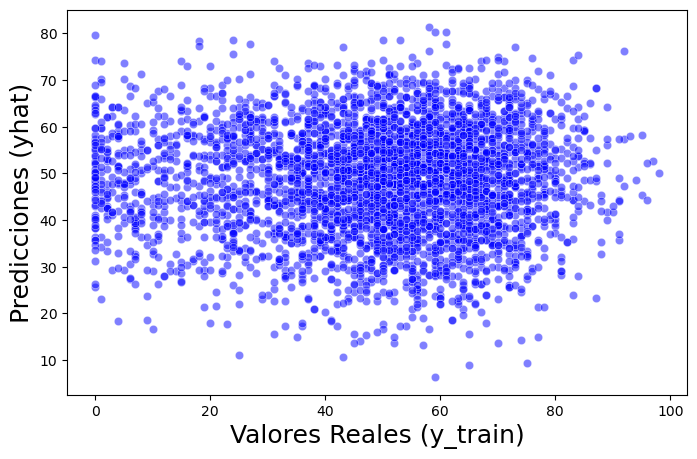

In [40]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 5. SDG regressor

In [41]:
#Crear un modelo de regresión SGD
sgd = SGDRegressor(max_iter=1000, tol=1e-3)

# Entrenar el modelo con los datos de entrenamiento
sgd.fit(X_train, y_train)

# Hacer predicciones con los datos de prueba
y_pred = sgd.predict(X_test)


In [42]:
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

X_train: (9149, 14), y_train: (9149,)
X_test: (3921, 14),  y_test: (3921,)
Predicciones: [-1.39407431e+19 -1.09406218e+19 -9.04683531e+18 ... -1.67768349e+19
 -1.34166404e+19 -1.29866572e+19]
Valores reales: [ 1 70 69 ... 25 50 76]


In [43]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(10)

,y_test,y_pred,diferencia
706,37,-1.544497e+18,4.174316e+18
3613,61,-2.645581e+18,4.337019e+18
1311,62,-3.234668e+18,5.217206e+18
2103,51,-2.760246e+18,5.412248e+18
2762,67,-3.817136e+18,5.697217e+18
67,52,-3.217980e+18,6.188423e+18
1728,65,-4.293201e+18,6.604925e+18
2492,50,-3.456172e+18,6.912345e+18
2384,62,-4.390484e+18,7.081427e+18
702,72,-5.408139e+18,7.511305e+18


### Metricas

In [44]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - sgd.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [45]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 1.2629603036477633e+19
MSE:	 1.7491886959180554e+38
R**2:	 -10.349526776081888
RAE:	 7.84387444286369e+17
RSE:	 4.294233482703615e+35
Adjusted R**2:	 -4.3096250005627684e+35


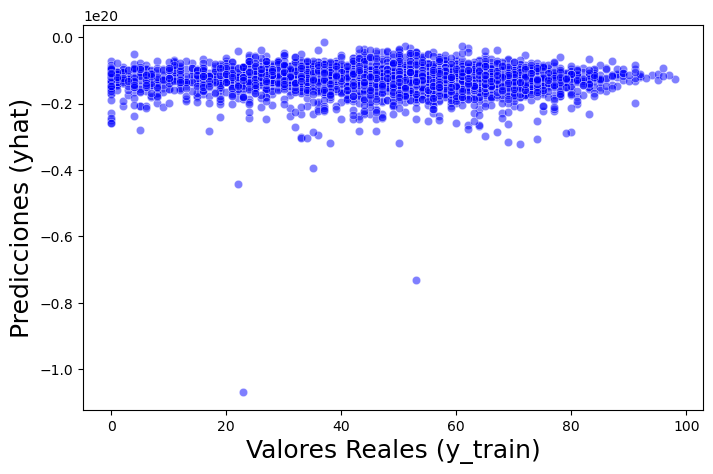

In [46]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 6. Essemble Regressor

In [47]:
#Crear un ensamblado de regresión Bagging con un modelo base de Regresión Lineal
base_estimator = LinearRegression()

# Crear un modelo de regresión Bagging
bag = BaggingRegressor(base_estimator=base_estimator, n_estimators=100, random_state=0)

# Entrenar el modelo con los datos de entrenamiento
bag.fit(X_train, y_train)

# Hacer predicciones con los datos de prueba
y_pred = bag.predict(X_test)


In [48]:
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

X_train: (9149, 14), y_train: (9149,)
X_test: (3921, 14),  y_test: (3921,)
Predicciones: [48.37103988 50.73702038 55.2362889  ... 45.67000995 44.85094105
 46.52103606]
Valores reales: [ 1 70 69 ... 25 50 76]


In [49]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
1753,46,45.997791,0.0048
2951,48,47.994004,0.0125
1647,49,48.993742,0.0128
555,50,50.009736,0.0195
2545,50,49.987473,0.0251


### Métricas

In [50]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - bag.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [51]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 15.917094922487504
MSE:	 398.865066093569
R**2:	 -38.51581069562769
RAE:	 0.9885638820676346
RSE:	 0.9792080899544272
Adjusted R**2:	 0.017282203629965465


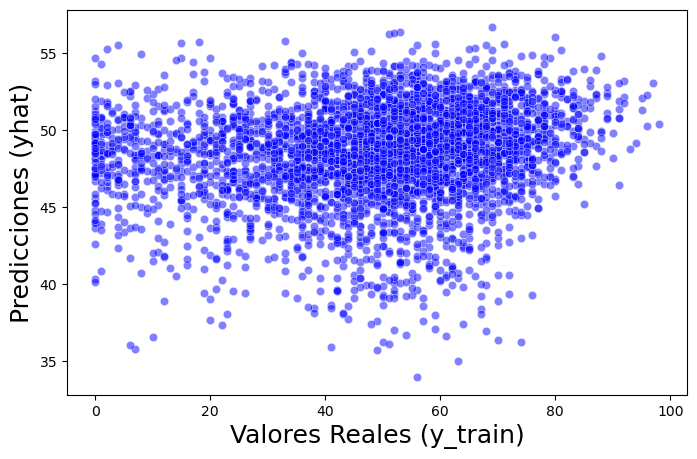

In [52]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

### 7.  Regression AdaBoost 

In [53]:
print(X_train.shape)
print(X_train.size)

(9149, 14)
128086


In [54]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=3767, random_state=0)

# Crear el modelo de AdaBoost
regr = AdaBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=0)

# Ajustar el modelo a los datos de entrenamiento
regr.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = regr.predict(X_test)


In [55]:
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

X_train: (9303, 14), y_train: (9303,)
X_test: (3767, 14),  y_test: (3767,)
Predicciones: [44.41593973 42.21436404 43.95045665 ... 45.04779874 48.56312057
 48.30813953]
Valores reales: [34  9 29 ... 60 57 55]


In [56]:
# Calcular el coeficiente de determinación
r2 = r2_score(y_test, y_pred)
print("Coeficiente de determinación: {:.2f}".format(r2))

Coeficiente de determinación: 0.02


In [57]:
print("X_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("X_test shape: ", X_test.shape)
print("y_test shape: ", y_test.shape)


X_train shape:  (9303, 14)
y_train shape:  (9303,)
X_test shape:  (3767, 14)
y_test shape:  (3767,)


In [58]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
2693,43,43.007427,0.0173
568,45,44.974343,0.0570
1231,45,44.974343,0.0570
35,42,41.953081,0.1117
1603,44,43.950457,0.1126


### Métricas

In [59]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - regr.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [60]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 16.12924892346334
MSE:	 393.28475662566564
R**2:	 -36.67155614490849
RAE:	 1.0146075571530488
RSE:	 0.9789137348045902
Adjusted R**2:	 0.017433602005840432


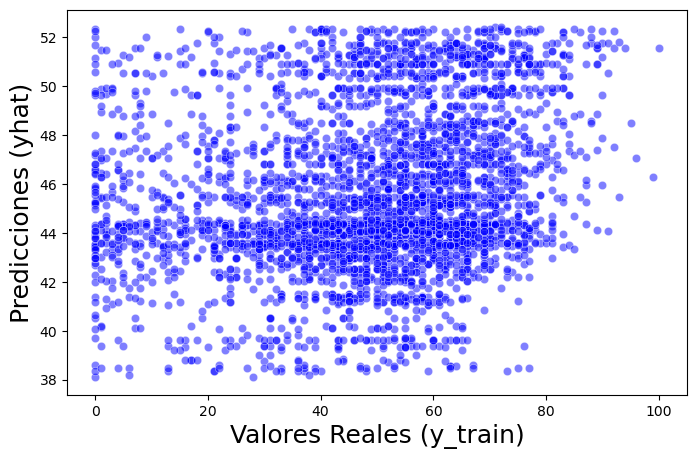

In [61]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

## 8. Gradient Boosting Regression 

In [62]:
# Crear el modelo de Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,
                               max_depth=1, random_state=0, loss='squared_error')

# Ajustar el modelo a los datos de entrenamiento
gb.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = gb.predict(X_test)


In [63]:
# Calcular el coeficiente de determinación
r2 = r2_score(y_test, y_pred)
print("Coeficiente de determinación: {:.2f}".format(r2))

Coeficiente de determinación: 0.04


In [64]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
1316,48,48.002197,0.0046
3574,46,46.016369,0.0356
3523,49,49.022984,0.0469
3015,50,49.974399,0.0512
3579,43,43.032286,0.0751


### Métricas 

In [65]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - gb.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [66]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 15.575575025330329
MSE:	 386.92969625125255
R**2:	 -45.369575940519674
RAE:	 0.9797787982995015
RSE:	 0.9630955374775408
Adjusted R**2:	 0.03331082245724437


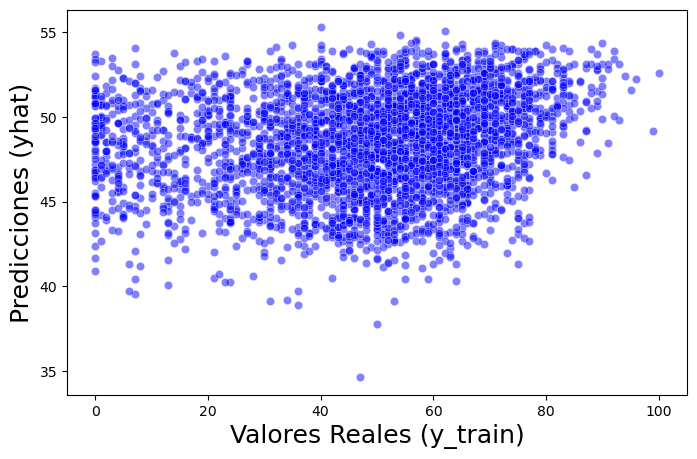

In [67]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

# Metodos de Validación


## Funciones de validación

In [68]:
def holdout_validation(model, X, y, iterations=100):
    mae = list()
    mse = list()
    r2 = list()
    rae = list()
    rse = list()
    adj_r2 = list()
    for i in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mae.append(mean_absolute_error(y_test, y_pred))
        mse.append(mean_squared_error(y_test, y_pred))
        r2.append(r2_score(y_test, y_pred))
        rae.append(np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test)))))
        rse.append(np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test)))))
        adj_r2.append(1 - (1-r2_score(y_test, y_pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))     
    print(f'Media MAE: {np.mean(mae)}')
    print(f'Media MSE: {np.mean(mse)}')
    print(f'Media R^2: {np.mean(r2)}')
    print(f'Media RAE: {np.mean(rae)}')
    print(f'Media RSE: {np.mean(rse)}')
    print(f'Media Adjusted R^2: {np.mean(adj_r2)}')
    return

In [69]:
def loo_validation(model, X, y):
    loo = LeaveOneOut()
    mae =list()
    mse =list()
    rae =list()
    rse =list()
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mae.append(mean_absolute_error(y_test, y_pred))
        mse.append(mean_squared_error(y_test, y_pred))
        rae.append(np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test)))))
        rse.append(np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test)))))
    print(f'Media MAE: {np.mean(mae)}')
    print(f'Media MSE: {np.mean(mse)}')
    print(f'Media RAE: {np.mean(rae)}')
    print(f'Media RSE: {np.mean(rse)}')
    return


In [70]:
#def loo_validation(model, X, y):
#    loo = LeaveOneOut()
 #   mae =list()
 #   mse =list()
#    rae =list()
   # rse =list()
  #  for train_index, test_index in loo.split(X):
 #       X_train, X_test = X[train_index], X[test_index]
#        y_train, y_test = y[train_index], y[test_index]
        #model.fit(X_train, y_train)
       # y_pred = model.predict(X_test)
      #  mae.append(mean_absolute_error(y_test, y_pred))
     #   mse.append(mean_squared_error(y_test, y_pred))
    #    rae.append(np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.nanmean(y_test)))))
   #     rse.append(np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.nanmean(y_test)))))
  #  print(f'Media MAE: {np.mean(mae)}')
 #   print(f'Media MSE: {np.mean(mse)}')
#    print(f'Media RAE: {np.nanmean(rae)}')
#    print(f'Media RSE: {np.nanmean(rse)}')
#    return

In [71]:
def k_fold_validation(model, X, y, k=5):
    kf = KFold(n_splits=k)
    mae = list()
    mse = list()
    r2 = list()
    rae = list()
    rse = list()
    adj_r2 = list()
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mae.append(mean_absolute_error(y_test, y_pred))
        mse.append(mean_squared_error(y_test, y_pred))
        r2.append(r2_score(y_test, y_pred))
        rae.append(np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test)))))
        rse.append(np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test)))))
        adj_r2.append(1 - (1 - r2_score(y_test, y_pred)) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1))
    print(f'Media MAE: {np.mean(mae)}')
    print(f'Media MSE: {np.mean(mse)}')
    print(f'Media R^2: {np.mean(r2)}')
    print(f'Media RAE: {np.mean(rae)}')
    print(f'Media RSE: {np.mean(rse)}')
    print(f'Media Adjusted R^2: {np.mean(adj_r2)}')
    return


### Aplicación de las funciones a los distintos métodos

* Regresion Multiple

In [72]:
print("Hold Out Validation")
holdout_validation(regresion_lineal, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(regresion_lineal,  X, y)

Hold Out Validation
Media MAE: 15.764724182184947
Media MSE: 394.9830645632883
Media R^2: 0.019409465956169707
Media RAE: 0.9903789588265538
Media RSE: 0.9805905340438303
Media Adjusted R^2: 0.014127331490369927
-------
k-Fold Cross Validation
Media MAE: 16.130564911420212
Media MSE: 411.0572382114566
Media R^2: -0.042600364226022334
Media RAE: 1.028026869238854
Media RSE: 1.0426003642260224
Media Adjusted R^2: -0.04821652624955612


* Decision tree regressor

In [73]:
print("Hold Out Validation")
holdout_validation(decision, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(decision,  X, y)

Hold Out Validation
Media MAE: 21.743104437643456
Media MSE: 774.0821643075745
Media R^2: -0.9178716805377778
Media RAE: 1.3653580483635483
Media RSE: 1.9178716805377782
Media Adjusted R^2: -0.9282026553463694
-------
k-Fold Cross Validation
Media MAE: 22.621499617444528
Media MSE: 822.2048967100229
Media R^2: -1.1009551913791196
Media RAE: 1.4461839089174604
Media RSE: 2.1009551913791196
Media Adjusted R^2: -1.1122723797897804


* Random forest regressor

In [74]:
print("Hold Out Validation")
holdout_validation(forest, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(forest,  X, y)

Hold Out Validation
Media MAE: 15.445420964639426
Media MSE: 382.5286539603723
Media R^2: 0.053173668621476634
Media RAE: 0.9687452062820948
Media RSE: 0.9468263313785233
Media Adjusted R^2: 0.04807341135356615
-------
k-Fold Cross Validation
Media MAE: 16.08523229587933
Media MSE: 407.6539384284049
Media R^2: -0.03475606389610333
Media RAE: 1.0252753866500253
Media RSE: 1.0347560638961033
Media Adjusted R^2: -0.040329971127556055


* KNN regressor

In [75]:
print("Hold Out Validation")
holdout_validation(neigh, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(neigh,  X, y)

Hold Out Validation
Media MAE: 18.48939683754144
Media MSE: 541.4843386040975
Media R^2: -0.3376110172089237
Media RAE: 1.1578168064245569
Media RSE: 1.3376110172089235
Media Adjusted R^2: -0.3448163093370209
-------
k-Fold Cross Validation
Media MAE: 18.713516959959193
Media MSE: 550.5531667091728
Media R^2: -0.3993219361137293
Media RAE: 1.1933553428618722
Media RSE: 1.3993219361137292
Media Adjusted R^2: -0.4068596456580126


* SGD regressor

In [76]:
print("Hold Out Validation")
holdout_validation(sgd, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(sgd,  X, y)

Hold Out Validation
Media MAE: 6.797244139141694e+18
Media MSE: 7.610937252154982e+37
Media R^2: -1.8936447959834032e+35
Media RAE: 4.271363951009256e+17
Media RSE: 1.8936447959834032e+35
Media Adjusted R^2: -1.9038452681433753e+35
-------
k-Fold Cross Validation
Media MAE: 1.2457467610430607e+19
Media MSE: 1.9296950151011574e+38
Media R^2: -4.895452758229114e+35
Media RAE: 7.935771578053413e+17
Media RSE: 4.895452758229114e+35
Media Adjusted R^2: -4.92182303087829e+35


* Essemble regressor

In [77]:
print("Hold Out Validation")
holdout_validation(bag, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(bag,  X, y)

Hold Out Validation
Media MAE: 15.778125164239295
Media MSE: 396.1738292663132
Media R^2: 0.02071000038142823
Media RAE: 0.9890905904284029
Media RSE: 0.9792899996185715
Media Adjusted R^2: 0.015434871487753743
-------
k-Fold Cross Validation
Media MAE: 16.132321207924527
Media MSE: 411.159573593605
Media R^2: -0.04286728228757959
Media RAE: 1.0281453581759255
Media RSE: 1.0428672822875797
Media Adjusted R^2: -0.04848488211521562


* Adaboost

In [78]:
print("Hold Out Validation")
holdout_validation(regr, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(regr,  X, y)

Hold Out Validation
Media MAE: 16.21909961815631
Media MSE: 397.1392673370155
Media R^2: 0.01816849075575377
Media RAE: 1.0166057021063934
Media RSE: 0.9818315092442462
Media Adjusted R^2: 0.012879671544742049
-------
k-Fold Cross Validation
Media MAE: 16.410417022546
Media MSE: 407.0662061716986
Media R^2: -0.033679799725698324
Media RAE: 1.0457285949071347
Media RSE: 1.0336797997256983
Media Adjusted R^2: -0.03924790945873402


* Gradient Boosting

In [79]:
print("Hold Out Validation")
holdout_validation(gb, X, y)
print("-------")
print("k-Fold Cross Validation")
k_fold_validation(gb,  X, y)

Hold Out Validation
Media MAE: 15.635266664823593
Media MSE: 389.76277960738827
Media R^2: 0.036121171626875226
Media RAE: 0.9806594798839652
Media RSE: 0.9638788283731249
Media Adjusted R^2: 0.03092905789189111
-------
k-Fold Cross Validation
Media MAE: 15.99206042755822
Media MSE: 404.0063839526757
Media R^2: -0.024507670803124038
Media RAE: 1.019105463969078
Media RSE: 1.024507670803124
Media Adjusted R^2: -0.030026373146811537


# GridSearchCV

In [80]:
# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

# Crear un diccionario con los modelos a evaluar
models = {
    'Linear_Regression': make_pipeline(StandardScaler(), LinearRegression()),
    'Decision_Tree': DecisionTreeRegressor(),
    'Random_Forest': RandomForestRegressor(),
    'K-NN': KNeighborsRegressor(),
    'SGD': SGDRegressor(),
    'AdaBoost': AdaBoostRegressor(),
    'Gradient_Boosting': GradientBoostingRegressor()
}

# Crear un diccionario con los parámetros a evaluar para cada modelo
param_grid = {
    'Linear_Regression': {'linearregression__fit_intercept': [True, False]},
    'Decision_Tree': {'max_depth': [2, 4, 8], 'min_samples_leaf': [2, 4, 8]},
    'Random_Forest': {'n_estimators': [10, 50, 100], 'max_depth': [2, 4, 8]},
    'K-NN': {'n_neighbors': [2, 4, 8], 'weights': ['uniform', 'distance']},
    'SGD': {'loss': ['squared_error', 'huber'], 'alpha': [0.1, 0.01, 0.001], 'max_iter': [1000, 5000, 10000]},
    'AdaBoost': {'n_estimators': [10, 50, 100], 'learning_rate': [0.1, 0.01, 0.001]},
    'Gradient_Boosting': {'n_estimators': [10, 50, 100], 'learning_rate': [0.1, 0.01, 0.001], 'max_depth': [2, 4, 8]}
}
# Iterar sobre cada modelo
for model_name, model in models.items():
    # Crear una instancia de GridSearchCV
    grid_search = GridSearchCV(model, param_grid[model_name], cv=5, scoring='neg_mean_squared_error')
    
    # Ajustar el modelo con los datos de entrenamiento
    grid_search.fit(X_train, y_train)
    
    # Imprimir los mejores parámetros encontrados
    print(f"{model_name} best params: {grid_search.best_params_}")
    
    # Utilizar los mejores parámetros para hacer predicciones
    y_pred = grid_search.predict(X_test)
    
    # Calcular el error cuadrático medio
    mse = mean_squared_error(y_test, y_pred)
    r2  = r2_score(y_test, y_pred)
    rae = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
    rse = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
    print(f"{model_name} MSE: {mse}")
    print(f"{model_name} R**2: {r2}")
    print(f"{model_name} RAE: {rae}")
    print(f"{model_name} RSE: {rse}")

Linear_Regression best params: {'linearregression__fit_intercept': True}
Linear_Regression MSE: 408.82472567322793
Linear_Regression R**2: 0.023359484479375636
Linear_Regression RAE: 0.9875736842923913
Linear_Regression RSE: 0.9766405155206244
Decision_Tree best params: {'max_depth': 4, 'min_samples_leaf': 8}
Decision_Tree MSE: 404.9704547354957
Decision_Tree R**2: 0.03256694410497496
Decision_Tree RAE: 0.9789206858162208
Decision_Tree RSE: 0.967433055895025
Random_Forest best params: {'max_depth': 8, 'n_estimators': 100}
Random_Forest MSE: 390.9120944593178
Random_Forest R**2: 0.0661509309954239
Random_Forest RAE: 0.9621446460542089
Random_Forest RSE: 0.9338490690045761
K-NN best params: {'n_neighbors': 8, 'weights': 'uniform'}
K-NN MSE: 467.3394283186687
K-NN R**2: -0.11642616391327398
K-NN RAE: 1.0550793160936622
K-NN RSE: 1.116426163913274


C:\Users\Fgonz\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\Fgonz\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\Fgonz\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\Fgonz\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\Fgonz\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning:

M

SGD best params: {'alpha': 0.1, 'loss': 'huber', 'max_iter': 1000}
SGD MSE: 215007848319.88513
SGD R**2: -513631789.44105405
SGD RAE: 27149.62697161016
SGD RSE: 513631790.44105405
AdaBoost best params: {'learning_rate': 0.01, 'n_estimators': 50}
AdaBoost MSE: 403.1142830679677
AdaBoost R**2: 0.03700114864405735
AdaBoost RAE: 0.9804493125657839
AdaBoost RSE: 0.9629988513559427
Gradient_Boosting best params: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100}
Gradient_Boosting MSE: 394.0296091808977
Gradient_Boosting R**2: 0.05870350672378011
Gradient_Boosting RAE: 0.9648813485955264
Gradient_Boosting RSE: 0.9412964932762199


* Linear_Regression best params: {'linearregression__fit_intercept': True}
    * Linear_Regression MSE: 408.82472567322793
    * Linear_Regression R**2: 0.023359484479375636
    * Linear_Regression RAE: 0.9875736842923913
    * Linear_Regression RSE: 0.9766405155206244
* Decision_Tree best params: {'max_depth': 4, 'min_samples_leaf': 8}
    * Decision_Tree MSE: 404.9704547354957
    * Decision_Tree R**2: 0.03256694410497496
    * Decision_Tree RAE: 0.9789206858162208
    * Decision_Tree RSE: 0.967433055895025
* Random_Forest best params: {'max_depth': 8, 'n_estimators': 100}
    * Random_Forest MSE: 390.85943135726814
    * Random_Forest R**2: 0.06627673776762921
    * Random_Forest RAE: 0.9622389222642055
    * Random_Forest RSE: 0.9337232622323708
* K-NN best params: {'n_neighbors': 8, 'weights': 'uniform'}
    * K-NN MSE: 467.3394283186687
    * K-NN R**2: -0.11642616391327398
    * K-NN RAE: 1.0550793160936622
    * K-NN RSE: 1.116426163913274
* SGD best params: {'alpha': 0.01, 'loss': 'huber', 'max_iter': 1000}
    * SGD MSE: 212815001644.7413
    * SGD R**2: -508393302.6940906
    * SGD RAE: 26982.28541240553
    * SGD RSE: 508393303.6940906
* AdaBoost best params: {'learning_rate': 0.01, 'n_estimators': 100}
    * AdaBoost MSE: 403.3618970714061
    * AdaBoost R**2: 0.03640962407917203
    * AdaBoost RAE: 0.9839515357171972
    * AdaBoost RSE: 0.963590375920828
* Gradient_Boosting best params: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 50}
    * Gradient_Boosting MSE: 392.7541594267933
    * Gradient_Boosting R**2: 0.06175042592202051
    * Gradient_Boosting RAE: 0.9640960918626459
    * Gradient_Boosting RSE: 0.9382495740779795

# Mejor método : Random forest; Tunning

In [81]:
forest = RandomForestRegressor(max_depth = 8,
                             random_state = 0,
                             n_estimators = 100,
                             n_jobs = -1)

print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")

forest.fit(X_train, y_train)

y_pred = forest.predict(X_test)
print(y_pred, y_test)


X_train: (10456, 14), y_train: (10456,)
X_test: (2614, 14),  y_test: (2614,)
[49.6903404  52.44656731 57.74727146 ... 45.40981402 46.33987624
 47.58831431] [ 1 70 69 ... 42 46 59]


In [82]:
print("Predicciones:", y_pred)
print("Valores reales:", y_test)

Predicciones: [49.6903404  52.44656731 57.74727146 ... 45.40981402 46.33987624
 47.58831431]
Valores reales: [ 1 70 69 ... 42 46 59]


In [83]:
df_pred = pd.DataFrame()
df_pred["y_test"] = y_test.flatten()
df_pred["y_pred"] = y_pred.flatten()
df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["y_pred"]) / df_pred["y_test"] * 100), 4)
df_pred = df_pred.sort_values("diferencia")
df_pred.head(5)

,y_test,y_pred,diferencia
1931,49,48.990738,0.0189
749,49,48.976316,0.0483
2271,51,51.034836,0.0683
2231,49,48.951079,0.0998
742,54,54.056012,0.1037


## Métricas

In [84]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - gb.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [85]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 15.687277205564685
MSE:	 390.32732497825134
R**2:	 -16.76423498142808
RAE:	 0.9604900654728195
RSE:	 0.932452114438022
Adjusted R**2:	 0.033552760836860096


## Visualizaciones

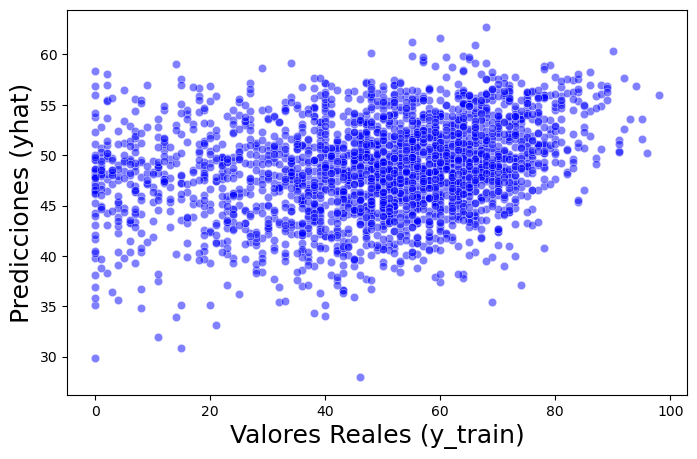

In [86]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

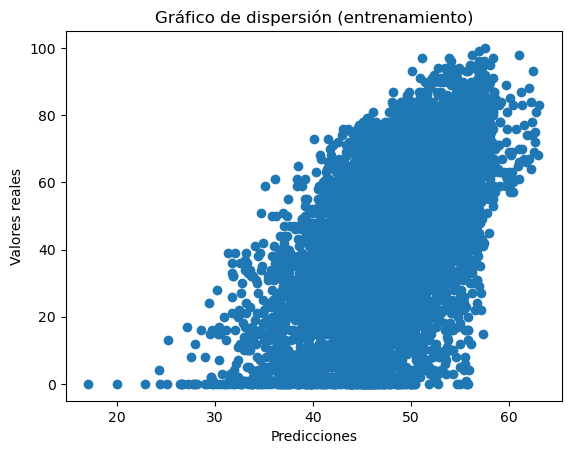

In [87]:
#Gráfico de dispersión:
import matplotlib.pyplot as plt

y_pred_train = forest.predict(X_train)

plt.scatter(y_pred_train, y_train)
plt.xlabel("Predicciones")
plt.ylabel("Valores reales")
plt.title("Gráfico de dispersión (entrenamiento)")
plt.show()


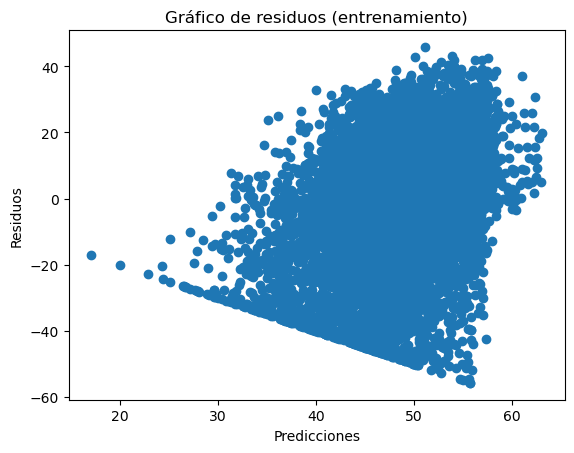

In [88]:
#Gráfico de residuos:

residuos = y_train - y_pred_train

plt.scatter(y_pred_train, residuos)
plt.xlabel("Predicciones")
plt.ylabel("Residuos")
plt.title("Gráfico de residuos (entrenamiento)")
plt.show()


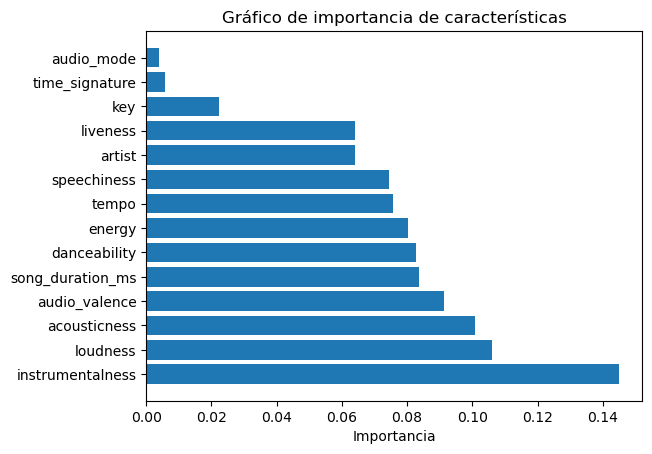

In [89]:
#Gráfico de importancia de características:


feature_names = ["song_duration_ms", "acousticness", "danceability", "energy", "instrumentalness", "key", "liveness", "loudness", "audio_mode", "speechiness", "tempo", "time_signature", "audio_valence", "artist"]

importancias = pd.DataFrame({"característica": feature_names, "importancia": forest.feature_importances_})

importancias = importancias.sort_values(by="importancia", ascending=False)

plt.barh(range(len(importancias)), importancias["importancia"])
plt.yticks(range(len(importancias)), importancias["característica"])
plt.xlabel("Importancia")
plt.title("Gráfico de importancia de características")
plt.show()


# Ponemos a prueba el metodo con datos actuales


### Dataframe test

In [90]:
dftest = pd.read_csv("song_data_2023.csv")

In [91]:
dftest.shape

(100, 16)

In [92]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         100 non-null    object 
 1   artist_name       100 non-null    object 
 2   song_popularity   100 non-null    int64  
 3   song_duration_ms  100 non-null    int64  
 4   acousticness      100 non-null    float64
 5   danceability      100 non-null    float64
 6   energy            100 non-null    float64
 7   instumentalness   100 non-null    float64
 8   key               100 non-null    int64  
 9   liveness          100 non-null    float64
 10  loudness          100 non-null    float64
 11  audio_mode        100 non-null    int64  
 12  speechiness       100 non-null    float64
 13  tempo             100 non-null    float64
 14  time_signature    100 non-null    int64  
 15  audio_valence     100 non-null    float64
dtypes: float64(9), int64(5), object(2)
memory usa

In [93]:
dftest = dftest[["song_name","song_popularity", "song_duration_ms", "acousticness", "danceability", "energy", "instumentalness", "key", "liveness", "loudness", "audio_mode", "speechiness", "tempo", "time_signature", "audio_valence", "artist_name"]]

In [94]:
dftest["artist"]= dftest["artist_name"]
dftest["instrumentalness"]=dftest["instumentalness"]

In [95]:
dftest.song_duration_ms= dftest.song_duration_ms.astype(float)
dftest.time_signature= dftest.time_signature.astype(float)
dftest.audio_mode= dftest.audio_mode.astype(float)

In [96]:
dftest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         100 non-null    object 
 1   song_popularity   100 non-null    int64  
 2   song_duration_ms  100 non-null    float64
 3   acousticness      100 non-null    float64
 4   danceability      100 non-null    float64
 5   energy            100 non-null    float64
 6   instumentalness   100 non-null    float64
 7   key               100 non-null    int64  
 8   liveness          100 non-null    float64
 9   loudness          100 non-null    float64
 10  audio_mode        100 non-null    float64
 11  speechiness       100 non-null    float64
 12  tempo             100 non-null    float64
 13  time_signature    100 non-null    float64
 14  audio_valence     100 non-null    float64
 15  artist_name       100 non-null    object 
 16  artist            100 non-null    object 
 17

In [97]:
dftest

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,artist_name,artist,instrumentalness
0,"Shakira: Bzrp Music Sessions, Vol. 53",98,218289.0,0.2740,0.778,0.632,0.000000,2,0.0915,-5.600,0.0,0.0493,122.104,4.0,0.498,Bizarrap,Bizarrap,0.000000
1,Flowers,98,200455.0,0.0632,0.707,0.681,0.000005,0,0.0322,-4.325,1.0,0.0668,117.999,4.0,0.646,Miley Cyrus,Miley Cyrus,0.000005
2,Los Angeles,63,163360.0,0.2910,0.776,0.665,0.000000,11,0.1620,-6.078,0.0,0.3960,98.211,4.0,0.872,Myke Towers,Myke Towers,0.000000
3,CORAZONES ROTOS,74,230130.0,0.2380,0.788,0.782,0.000420,9,0.0773,-5.517,1.0,0.0513,123.042,4.0,0.525,Lola Indigo,Lola Indigo,0.000420
4,VISTA AL MAR,37,180673.0,0.8030,0.759,0.561,0.121000,0,0.1010,-5.643,0.0,0.1310,104.915,4.0,0.491,Quevedo,Quevedo,0.121000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,All I Want For Christmas Is You (SuperFestive!),0,239920.0,0.3150,0.562,0.937,0.000000,9,0.4480,-4.059,0.0,0.0596,150.001,4.0,0.437,Justin Bieber,Justin Bieber,0.000000
96,Family Affair (Dance for Me),0,158391.0,0.0784,0.869,0.726,0.000000,11,0.1070,-5.654,0.0,0.0459,124.023,4.0,0.343,David Guetta,David Guetta,0.000000
97,As I Am,0,174406.0,0.1270,0.595,0.543,0.000000,11,0.0975,-8.149,1.0,0.0380,99.928,4.0,0.109,Justin Bieber,Justin Bieber,0.000000
98,2step,0,153627.0,0.1690,0.763,0.661,0.000000,4,0.1170,-5.592,0.0,0.0560,95.002,4.0,0.632,Ed Sheeran,Ed Sheeran,0.000000


In [98]:
X_train = df[['song_duration_ms', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature', 'audio_valence']]
y_train = df['song_popularity']
X_test = dftest[['song_duration_ms', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature', 'audio_valence']]
y_test = dftest['song_popularity']

forest = RandomForestRegressor(max_depth = 8,
                             random_state = 0,
                             n_estimators = 100,
                             n_jobs = -1)


forest.fit(X_train, y_train)

y_pred = forest.predict(X_test)

for i, j in zip(y_pred[:5], y_test[:5]):
    print(f"Predicción:{i} \tValor real:{j}")


Predicción:56.84315679420872 	Valor real:98
Predicción:55.24282207642172 	Valor real:98
Predicción:51.33682477517389 	Valor real:63
Predicción:49.89786414424407 	Valor real:74
Predicción:46.074659533044425 	Valor real:37


In [99]:
RAE = np.sum(np.abs(np.subtract(y_test, y_pred))) / np.sum(np.abs(np.subtract(y_test, np.mean(y_test))))
RSE = np.sum(np.square(np.subtract(y_test, y_pred))) / np.sum(np.square(np.subtract(y_test, np.mean(y_test))))
r2_ajustada = 1 - (1 - forest.score(X_test, y_test))*(len(y_test) - 1)/(len(y_test) - X_test.shape[1] - 1)

In [100]:
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")


RAE:	 2.231536588491788
RSE:	 3.606540777355189
Adjusted R**2:	 -3.151715546025158


In [101]:
print(f"MAE:\t {mean_absolute_error(y_pred, y_test)}")
print(f"MSE:\t {mean_squared_error(y_pred, y_test)}")
print(f"R**2:\t {r2_score(y_pred, y_test)}")

MAE:	 42.770522869668994
MSE:	 2104.4439532966608
R**2:	 -185.07616715311912


In [102]:
y_pred = np.array(y_pred)
y_test = np.array(y_test)


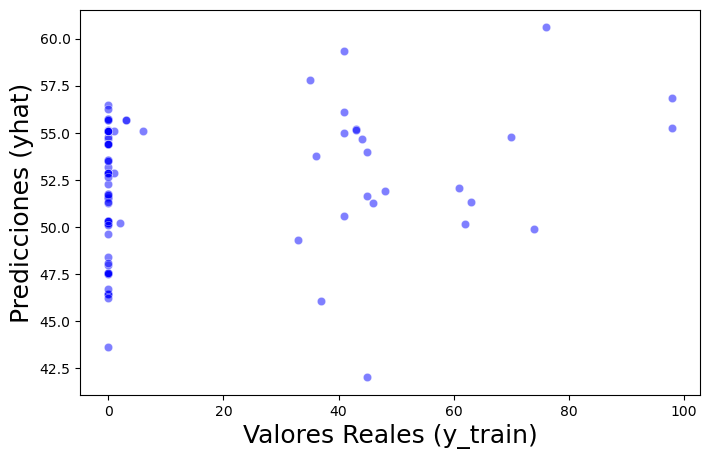

In [103]:
plt.figure(figsize = (8, 5))
sns.scatterplot(x = y_test.flatten(), y = y_pred.flatten(), alpha = 0.5, color = "blue")
plt.xlabel("Valores Reales (y_train)", size = 18)
plt.ylabel("Predicciones (yhat)", size = 18)
plt.show()

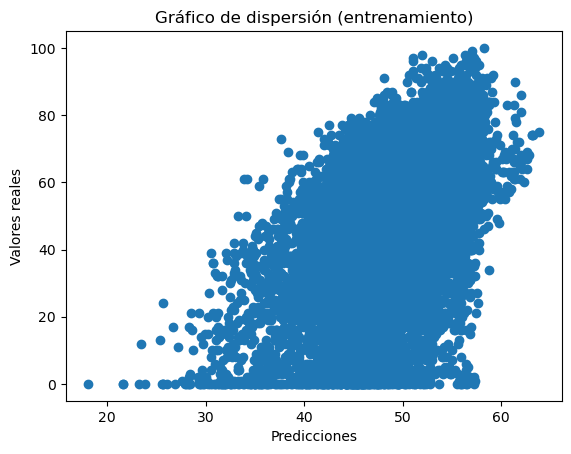

In [104]:
#Gráfico de dispersión:
import matplotlib.pyplot as plt

y_pred_train = forest.predict(X_train)

plt.scatter(y_pred_train, y_train)
plt.xlabel("Predicciones")
plt.ylabel("Valores reales")
plt.title("Gráfico de dispersión (entrenamiento)")
plt.show()
